In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 974.5/974.5 kB 24.4 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 2.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 20.5 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 11.7 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 57.3 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.8.93
    Uninstalling nvidia-nvjitlink-cu12-12.8.93:
      Successfully uninstalled nvidia-nvjitlink-cu12-12.8.93
  Attempting uninstall: nvidia-curand-cu12
    Found existing

In [3]:
#!/usr/bin/env python3
"""
End-to-end script for:
  - Preparing an object detection dataset from a 'crop' folder (with one subfolder per class)
  - Training a YOLOv8 model
  - Evaluating the model on the validation data
  - Running inference (testing) on new images

Simply adjust the CROP_FOLDER variable and TEST_IMAGES_FOLDER (if needed). 
The crop folder is assumed to contain one subfolder per class, each with images.

Requirements:
    pip install ultralytics pyyaml
"""

import os
import random
import shutil
import yaml
from ultralytics import YOLO  # YOLOv8 from ultralytics

# ------------------------------
# Configuration / Parameters
# ------------------------------
# Specify the full path to your crop folder here
CROP_FOLDER = "/kaggle/input/militaryaircraftdetectiondataset/crop"  # Change if needed

# Optional: specify a folder of test images for inference after training (or use validation folder)
TEST_IMAGES_FOLDER = "/kaggle/input/militaryaircraftdetectiondataset/annotated_samples"  # Change as necessary; can be the validation folder

# Train/val split ratio: 80% training, 20% validation
TRAIN_RATIO = 0.8

# YOLO training configuration
NUM_EPOCHS = 30
YOLO_MODEL = "yolov8n.pt"  # Change to yolov8s.pt, yolov8m.pt, etc. if needed

# Valid image extensions
IMG_EXTENSIONS = [".jpg", ".jpeg", ".png", ".bmp"]

# Destination folder structure (relative to current working directory)
DATASET_FOLDER = "dataset"
TRAIN_IMAGES_DIR = os.path.join(DATASET_FOLDER, "images", "train")
VAL_IMAGES_DIR   = os.path.join(DATASET_FOLDER, "images", "val")
TRAIN_LABELS_DIR = os.path.join(DATASET_FOLDER, "labels", "train")
VAL_LABELS_DIR   = os.path.join(DATASET_FOLDER, "labels", "val")
YOLO_YAML        = os.path.join(DATASET_FOLDER, "dataset.yaml")


# ------------------------------
# Helper Functions
# ------------------------------
def is_image_file(filename):
    """Return True if a file is an image based on its extension."""
    return any(filename.lower().endswith(ext) for ext in IMG_EXTENSIONS)

def create_dir_if_needed(dir_path):
    """Create a directory if it does not already exist."""
    os.makedirs(dir_path, exist_ok=True)

def prepare_directories():
    """Prepare the dataset directories for images and labels."""
    for d in [TRAIN_IMAGES_DIR, VAL_IMAGES_DIR, TRAIN_LABELS_DIR, VAL_LABELS_DIR]:
        create_dir_if_needed(d)
    print(f"Dataset directories created under '{DATASET_FOLDER}'.")

def process_class_folders(crop_folder):
    """
    Process each class folder inside the crop folder:
      - Copy images into train/val folders.
      - Generate a dummy YOLO annotation file for each image.
    Assumes each image contains a single object that fills the whole image.
    """
    # Get all subfolders (each considered as one class)
    class_names = sorted([d for d in os.listdir(crop_folder) if os.path.isdir(os.path.join(crop_folder, d))])
    print(f"Found {len(class_names)} classes.")

    # Map class names to numeric label IDs
    class_to_index = {cls_name: idx for idx, cls_name in enumerate(class_names)}

    for cls in class_names:
        cls_folder = os.path.join(crop_folder, cls)
        # List all image files in this class folder
        image_files = [f for f in os.listdir(cls_folder) if is_image_file(f)]
        num_images = len(image_files)
        if num_images == 0:
            print(f"Warning: No images found in folder '{cls_folder}'. Skipping.")
            continue

        # Shuffle and split into train and validation sets
        random.shuffle(image_files)
        num_train = int(num_images * TRAIN_RATIO)
        train_files = image_files[:num_train]
        val_files = image_files[num_train:]

        def process_files(file_list, img_dest_dir, label_dest_dir):
            for filename in file_list:
                src_path = os.path.join(cls_folder, filename)
                # To avoid filename collisions, prefix with the class name
                dest_filename = f"{cls}_{filename}"
                dest_img_path = os.path.join(img_dest_dir, dest_filename)
                shutil.copy2(src_path, dest_img_path)
                
                # Generate dummy annotation covering the full image:
                # Format: "class_id x_center y_center width height"
                # For full image, normalized bounding box is: 0.5, 0.5, 1.0, 1.0.
                label_content = f"{class_to_index[cls]} 0.5 0.5 1.0 1.0"
                base_name, _ = os.path.splitext(dest_filename)
                dest_label_path = os.path.join(label_dest_dir, base_name + ".txt")
                with open(dest_label_path, "w") as f:
                    f.write(label_content + "\n")

        # Process training and validation images
        process_files(train_files, TRAIN_IMAGES_DIR, TRAIN_LABELS_DIR)
        process_files(val_files, VAL_IMAGES_DIR, VAL_LABELS_DIR)
        print(f"Processed class '{cls}': {len(train_files)} train and {len(val_files)} val images.")

    return class_names

def generate_yaml(class_names):
    """Generate a YAML configuration file for YOLO using the processed dataset."""
    data = {
        "train": os.path.abspath(TRAIN_IMAGES_DIR),
        "val":   os.path.abspath(VAL_IMAGES_DIR),
        "nc":    len(class_names),
        "names": class_names
    }
    with open(YOLO_YAML, "w") as f:
        yaml.dump(data, f, default_flow_style=False)
    print(f"YAML configuration file generated at '{YOLO_YAML}'.")

def train_yolo():
    """Train the YOLO model using the ultralytics package."""
    print("Starting YOLO training...")
    model = YOLO(YOLO_MODEL)
    results = model.train(data=YOLO_YAML, epochs=NUM_EPOCHS)
    print("Training completed.")
    return results

def evaluate_model():
    """
    Evaluate the best trained model on the validation set using YOLO's built-in
    evaluation routine.
    """
    best_weights = os.path.join("runs", "detect", "train", "weights", "best.pt")
    if not os.path.exists(best_weights):
        print("Best model weights not found. Make sure training has completed successfully.")
        return
    print("Evaluating the model on the validation dataset...")
    model = YOLO(best_weights)
    # The .val() method will run evaluation on the val dataset defined in YOLO_YAML
    evaluation_results = model.val(data=YOLO_YAML)
    print("Evaluation completed. Metrics:")
    print(evaluation_results)

def test_model(test_folder):
    """
    Run inference on a folder of test images.
    The resulting images (with bounding boxes drawn) will be saved in a default output folder.
    """
    best_weights = os.path.join("runs", "detect", "train", "weights", "best.pt")
    if not os.path.exists(best_weights):
        print("Best model weights not found. Cannot run inference.")
        return
    print(f"Running inference on test images in folder: {test_folder}")
    model = YOLO(best_weights)
    # Predict on the given test folder; results are saved automatically.
    results = model.predict(source=test_folder, save=True)
    print("Inference completed. Check the generated runs/detect/predict folder for results.")

# ------------------------------
# Main Execution
# ------------------------------
def main():
    # Check that the crop folder exists
    if not os.path.exists(CROP_FOLDER):
        print(f"Error: The specified crop folder '{CROP_FOLDER}' does not exist.")
        return

    # Set a random seed for reproducibility
    random.seed(42)

    # Run pipeline: Prepare data, train, then evaluate and test
    prepare_directories()
    class_names = process_class_folders(CROP_FOLDER)
    if not class_names:
        print("No class folders found. Exiting.")
        return
    generate_yaml(class_names)
    train_yolo()
    evaluate_model()
    
    # Optionally run inference on a test set if provided
    if os.path.exists(TEST_IMAGES_FOLDER):
        test_model(TEST_IMAGES_FOLDER)
    else:
        print(f"Test images folder '{TEST_IMAGES_FOLDER}' does not exist. Skipping inference.")

if __name__ == "__main__":
    main()


Dataset directories created under 'dataset'.
Found 83 classes.
Processed class 'A10': 570 train and 143 val images.
Processed class 'A400M': 404 train and 102 val images.
Processed class 'AG600': 220 train and 56 val images.
Processed class 'AH64': 363 train and 91 val images.
Processed class 'AV8B': 359 train and 90 val images.
Processed class 'An124': 166 train and 42 val images.
Processed class 'An22': 81 train and 21 val images.
Processed class 'An225': 79 train and 20 val images.
Processed class 'An72': 144 train and 37 val images.
Processed class 'B1': 505 train and 127 val images.
Processed class 'B2': 422 train and 106 val images.
Processed class 'B21': 38 train and 10 val images.
Processed class 'B52': 482 train and 121 val images.
Processed class 'Be200': 236 train and 60 val images.
Processed class 'C130': 1170 train and 293 val images.
Processed class 'C17': 556 train and 139 val images.
Processed class 'C2': 650 train and 163 val images.
Processed class 'C390': 140 train a

train: Scanning /kaggle/working/dataset/labels/train.cache... 28256 images, 0 backgrounds, 42 corrupt: 100%|██████████| 28298/28298 [00:00<?, ?it/s]

train: WARNING ⚠️ /kaggle/working/dataset/images/train/An72_43b4d0f2e3bda68f420c5ae8d9861c95_0.jpg: ignoring corrupt image/label: image size (8, 29) <10 pixels
train: WARNING ⚠️ /kaggle/working/dataset/images/train/B1_3e8e9b33cae546f9cd705b04beb19b86_0.jpg: ignoring corrupt image/label: image size (9, 43) <10 pixels
train: WARNING ⚠️ /kaggle/working/dataset/images/train/B1_3e8e9b33cae546f9cd705b04beb19b86_2.jpg: ignoring corrupt image/label: image size (9, 45) <10 pixels
train: WARNING ⚠️ /kaggle/working/dataset/images/train/B2_815e60ecc084056ab212cb7e9fd0a8da_0.jpg: ignoring corrupt image/label: image size (6, 37) <10 pixels
train: WARNING ⚠️ /kaggle/working/dataset/images/train/B2_a07b28717e967e3aef1d9971871ae5e5_2.jpg: ignoring corrupt image/label: image size (9, 38) <10 pixels
train: WARNING ⚠️ /kaggle/working/dataset/images/train/B2_f2eb16b44951969dd5112bb2ec1ce230_0.jpg: ignoring corrupt image/label: image size (8, 29) <10 pixels
train: WARNING ⚠️ /kaggle/working/dataset/images/t

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/working/dataset/labels/val.cache... 7107 images, 0 backgrounds, 5 corrupt: 100%|██████████| 7112/7112 [00:00<?, ?it/s]

val: WARNING ⚠️ /kaggle/working/dataset/images/val/B1_3e8e9b33cae546f9cd705b04beb19b86_1.jpg: ignoring corrupt image/label: image size (9, 44) <10 pixels
val: WARNING ⚠️ /kaggle/working/dataset/images/val/B2_20119511433f4033037247136d240dbf_1.jpg: ignoring corrupt image/label: image size (9, 54) <10 pixels
val: WARNING ⚠️ /kaggle/working/dataset/images/val/B2_24ccde194acc7ed186a529293d7cbbff_0.jpg: ignoring corrupt image/label: image size (8, 44) <10 pixels
val: WARNING ⚠️ /kaggle/working/dataset/images/val/B52_6bf286cb8e8c25f8c5919b6a5ef99883_1.jpg: ignoring corrupt image/label: image size (6, 21) <10 pixels
val: WARNING ⚠️ /kaggle/working/dataset/images/val/F16_e511decc1e28e3f1c41ec70ba86110f5_1.jpg: ignoring corrupt image/label: image size (9, 20) <10 pixels


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train2
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      2.36G     0.1711      3.549     0.9103         54        640: 100%|██████████| 1766/1766 [05:54<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 223/223 [00:35<00:00,  6.37it/s]


                   all       7107       7107      0.486        0.1     0.0397     0.0396

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      4.47G     0.1651      2.801     0.8833         50        640: 100%|██████████| 1766/1766 [05:45<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 223/223 [00:32<00:00,  6.86it/s]


                   all       7107       7107      0.314      0.253      0.114      0.113

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      4.47G     0.1865      2.612     0.8883         48        640: 100%|██████████| 1766/1766 [05:41<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 223/223 [00:32<00:00,  6.87it/s]


                   all       7107       7107      0.374      0.177      0.112       0.11

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      4.47G     0.1719      2.443     0.8845         55        640: 100%|██████████| 1766/1766 [05:39<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 223/223 [00:33<00:00,  6.69it/s]


                   all       7107       7107      0.381      0.261      0.187      0.186

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      4.47G      0.135      2.257      0.874         56        640: 100%|██████████| 1766/1766 [05:40<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 223/223 [00:32<00:00,  6.91it/s]


                   all       7107       7107      0.453      0.285      0.244      0.243

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      4.47G     0.1166      2.147       0.87         49        640: 100%|██████████| 1766/1766 [05:38<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 223/223 [00:32<00:00,  6.89it/s]


                   all       7107       7107      0.434      0.345      0.284      0.282

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      4.47G     0.1049      2.065      0.867         57        640: 100%|██████████| 1766/1766 [05:40<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 223/223 [00:31<00:00,  6.97it/s]


                   all       7107       7107      0.404      0.368      0.344      0.344

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      4.47G        inf      1.995     0.8657         50        640: 100%|██████████| 1766/1766 [05:39<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 223/223 [00:32<00:00,  6.81it/s]


                   all       7107       7107      0.405      0.404      0.356      0.355

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      4.47G    0.08889      1.928     0.8614         57        640: 100%|██████████| 1766/1766 [05:39<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 223/223 [00:32<00:00,  6.93it/s]


                   all       7107       7107      0.462      0.425      0.417      0.415

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      4.47G    0.08289      1.865     0.8623         50        640: 100%|██████████| 1766/1766 [05:39<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 223/223 [00:32<00:00,  6.90it/s]


                   all       7107       7107      0.568      0.437      0.452      0.451

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      4.47G    0.07756      1.803     0.8594         45        640: 100%|██████████| 1766/1766 [05:39<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 223/223 [00:32<00:00,  6.94it/s]


                   all       7107       7107      0.568      0.463      0.489      0.485

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      4.47G    0.07375       1.76     0.8597         47        640: 100%|██████████| 1766/1766 [05:39<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 223/223 [00:32<00:00,  6.86it/s]


                   all       7107       7107      0.611      0.463       0.53      0.528

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      4.47G    0.07007      1.711     0.8599         53        640: 100%|██████████| 1766/1766 [05:39<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 223/223 [00:31<00:00,  6.97it/s]


                   all       7107       7107      0.551      0.524      0.552      0.548

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      4.47G    0.06706      1.654     0.8595         46        640: 100%|██████████| 1766/1766 [05:39<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 223/223 [00:32<00:00,  6.93it/s]


                   all       7107       7107      0.623      0.537      0.594      0.592

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      4.47G    0.06449      1.623     0.8586         47        640: 100%|██████████| 1766/1766 [05:40<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 223/223 [00:32<00:00,  6.86it/s]


                   all       7107       7107      0.653      0.543      0.621       0.62

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      4.47G    0.06124      1.568     0.8574         51        640: 100%|██████████| 1766/1766 [05:40<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 223/223 [00:32<00:00,  6.93it/s]


                   all       7107       7107      0.625      0.581      0.639      0.637

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      4.47G    0.05977      1.531     0.8558         40        640: 100%|██████████| 1766/1766 [05:40<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 223/223 [00:31<00:00,  6.98it/s]


                   all       7107       7107      0.639      0.604      0.665      0.663

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      4.47G    0.05711      1.492     0.8572         48        640: 100%|██████████| 1766/1766 [05:39<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 223/223 [00:31<00:00,  6.99it/s]


                   all       7107       7107      0.682      0.594      0.674      0.674

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      4.47G     0.0552      1.459     0.8546         52        640: 100%|██████████| 1766/1766 [05:39<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 223/223 [00:31<00:00,  6.99it/s]


                   all       7107       7107      0.712      0.615      0.696      0.695

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      4.47G    0.05245      1.413     0.8552         54        640: 100%|██████████| 1766/1766 [05:39<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 223/223 [00:31<00:00,  7.00it/s]


                   all       7107       7107       0.76      0.611      0.706      0.706
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      4.47G    0.05097      1.029     0.8417         16        640: 100%|██████████| 1766/1766 [05:39<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 223/223 [00:32<00:00,  6.97it/s]


                   all       7107       7107       0.77      0.648      0.736      0.736

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      4.47G        inf     0.9506     0.8421         16        640: 100%|██████████| 1766/1766 [05:38<00:00,  5.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 223/223 [00:31<00:00,  7.04it/s]


                   all       7107       7107      0.784      0.649      0.755      0.755

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      4.47G    0.04313     0.8774     0.8393         16        640: 100%|██████████| 1766/1766 [05:37<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 223/223 [00:31<00:00,  7.02it/s]


                   all       7107       7107      0.798      0.659      0.765      0.765

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      4.47G    0.03992     0.8099      0.838         16        640: 100%|██████████| 1766/1766 [05:37<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 223/223 [00:31<00:00,  7.01it/s]


                   all       7107       7107      0.762       0.69      0.777      0.777

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      4.47G    0.03753     0.7577     0.8395         16        640: 100%|██████████| 1766/1766 [05:38<00:00,  5.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 223/223 [00:31<00:00,  7.00it/s]


                   all       7107       7107      0.822      0.675      0.785      0.785

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      4.47G    0.02905     0.5199     0.8342         16        640: 100%|██████████| 1766/1766 [05:38<00:00,  5.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 223/223 [00:31<00:00,  7.08it/s]


                   all       7107       7107      0.857      0.696      0.808      0.808

30 epochs completed in 3.107 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 6.6MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 6.6MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.107 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 72 layers, 3,178,697 parameters, 0 gradients, 8.9 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 223/223 [00:33<00:00,  6.76it/s]


                   all       7107       7107      0.857      0.696      0.808      0.808
                   A10        143        143      0.931      0.818      0.901      0.901
                 A400M        102        102      0.906      0.754      0.847      0.847
                 AG600         56         56      0.854      0.964      0.974      0.974
                  AH64         91         91      0.889      0.792      0.936      0.936
                  AV8B         90         90      0.912      0.803      0.907      0.907
                 An124         42         42      0.835      0.786      0.851      0.851
                  An22         21         21      0.777      0.619      0.735      0.735
                 An225         20         20      0.522       0.35      0.546      0.546
                  An72         37         37      0.866      0.622      0.772      0.772
                    B1        126        126      0.866      0.821      0.896      0.896
                    B

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.1ms preprocess, 1.2ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs/detect/train2
Training completed.
Best model weights not found. Make sure training has completed successfully.
Best model weights not found. Cannot run inference.


Running inference on image: /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/0ec1c0f3259d1eb340045a19b8c36405.jpg

image 1/1 /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/0ec1c0f3259d1eb340045a19b8c36405.jpg: 608x640 (no detections), 39.4ms
Speed: 2.9ms preprocess, 39.4ms inference, 0.5ms postprocess per image at shape (1, 3, 608, 640)
Results saved to runs/detect/predict4
Inference completed.
Displaying output image from: runs/detect/predict/0000e97ea2d086d6759b19b288a8a72c.jpg


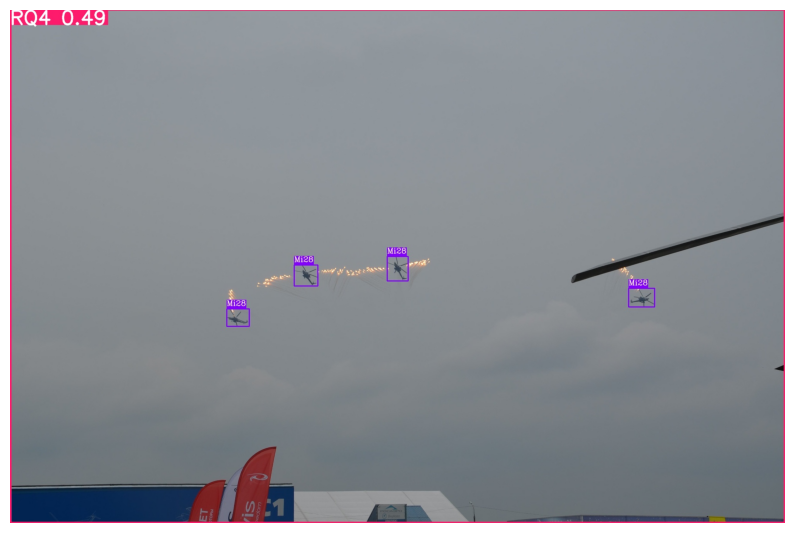

In [8]:
import os
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO

def test_image_with_display(image_path, weights_folder="runs/detect/train2"):
    # Define the path for the best model weights
    best_weights = os.path.join(weights_folder, "weights", "best.pt")
    if not os.path.exists(best_weights):
        print(f"Best model weights not found at {best_weights}. Ensure that training has completed successfully.")
        return

    print(f"Running inference on image: {image_path}")
    # Load the trained YOLO model
    model = YOLO(best_weights)
    # Run inference on the image. Save the output but do not attempt to show interactively.
    results = model.predict(source=image_path, save=True, show=False)
    print("Inference completed.")

    # The output image with detections is saved in runs/detect/predict by default.
    # We try to locate the output image.
    output_dir = "runs/detect/predict"
    filename = os.path.basename(image_path)
    output_path = os.path.join(output_dir, filename)
    
    # Sometimes YOLO may rename the file; if the exact name isn't found, pick the first image in the output folder.
    if not os.path.exists(output_path):
        output_files = [f for f in os.listdir(output_dir) if f.lower().endswith((".jpg", ".png"))]
        if output_files:
            output_path = os.path.join(output_dir, output_files[0])
        else:
            print("No output file found in the predict directory.")
            return

    print(f"Displaying output image from: {output_path}")
    # Read and display the image using cv2 and matplotlib
    img = cv2.imread(output_path)
    if img is None:
        print("Failed to load the output image.")
        return

    # Convert from BGR (OpenCV format) to RGB (matplotlib format)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    plt.axis("off")
    plt.show()

# Example usage:
IMAGE_PATH = "/kaggle/input/militaryaircraftdetectiondataset/annotated_samples/0ec1c0f3259d1eb340045a19b8c36405.jpg"  # Replace with the path to your test image.
test_image_with_display(IMAGE_PATH)


Processing image 1: /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/0000e97ea2d086d6759b19b288a8a72c.jpg

image 1/1 /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/0000e97ea2d086d6759b19b288a8a72c.jpg: 448x640 1 RQ4, 7.1ms
Speed: 2.4ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)


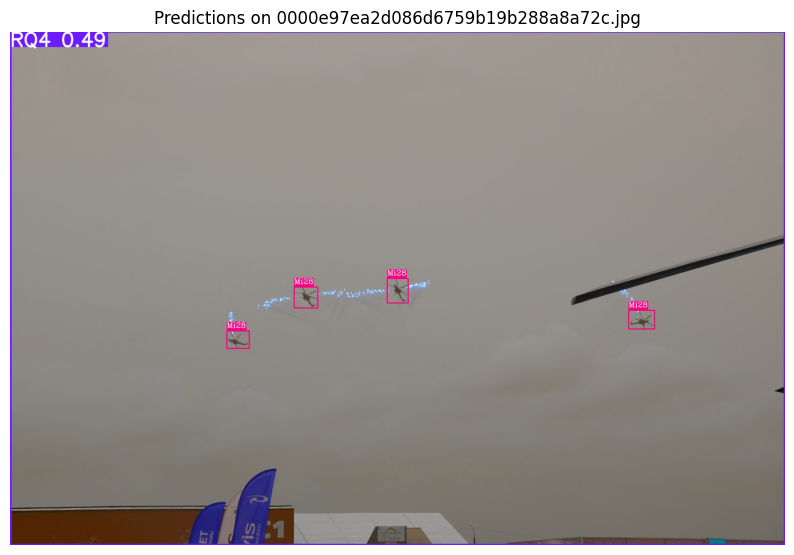

Processing image 2: /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/01b296b342b0a2a61628bedc371aca6c.jpg

image 1/1 /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/01b296b342b0a2a61628bedc371aca6c.jpg: 448x640 1 B1, 6.6ms
Speed: 2.3ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)


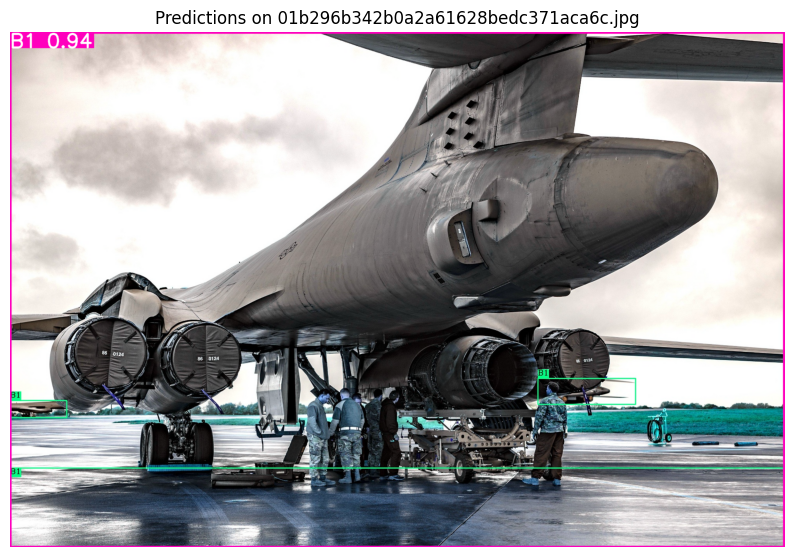

Processing image 3: /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/02f3c247916635747f734ed1b894e088.jpg

image 1/1 /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/02f3c247916635747f734ed1b894e088.jpg: 384x640 (no detections), 7.3ms
Speed: 2.0ms preprocess, 7.3ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)


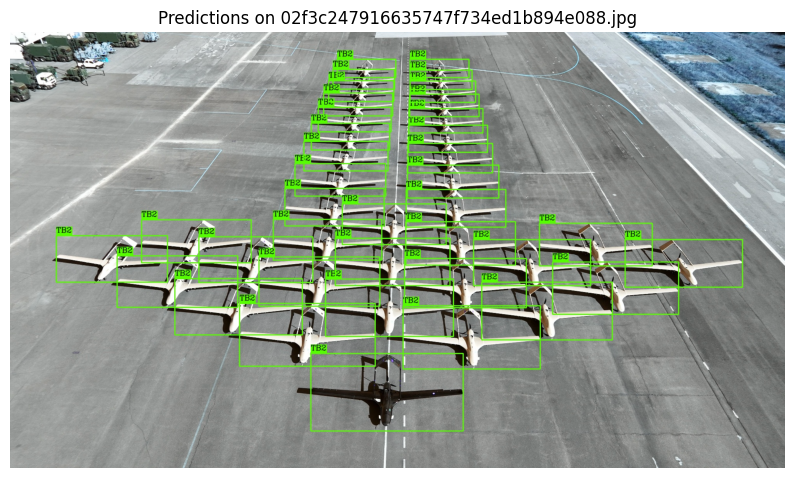

Processing image 4: /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/044425a07b59ca9b0f128f4f54eacc9a.jpg

image 1/1 /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/044425a07b59ca9b0f128f4f54eacc9a.jpg: 448x640 1 F16, 7.1ms
Speed: 2.2ms preprocess, 7.1ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)


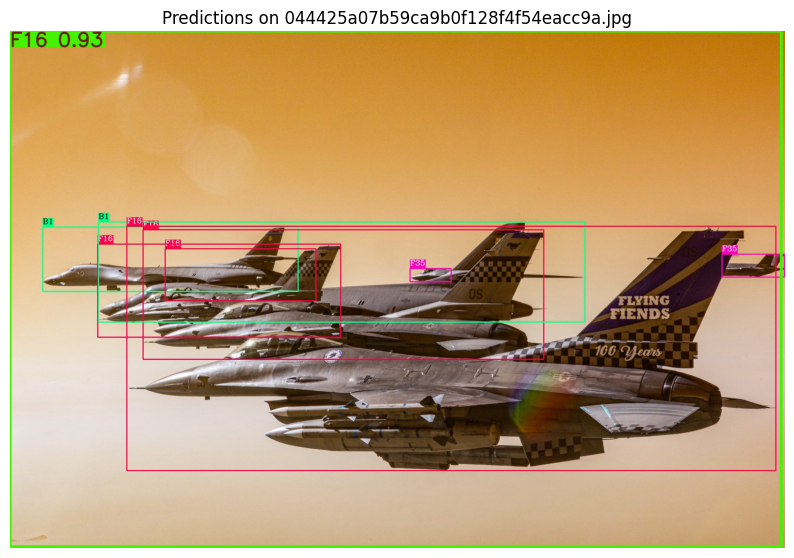

Processing image 5: /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/0a62a07d612287b5ef1b7b55a2999a04.jpg

image 1/1 /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/0a62a07d612287b5ef1b7b55a2999a04.jpg: 416x640 (no detections), 7.3ms
Speed: 2.5ms preprocess, 7.3ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


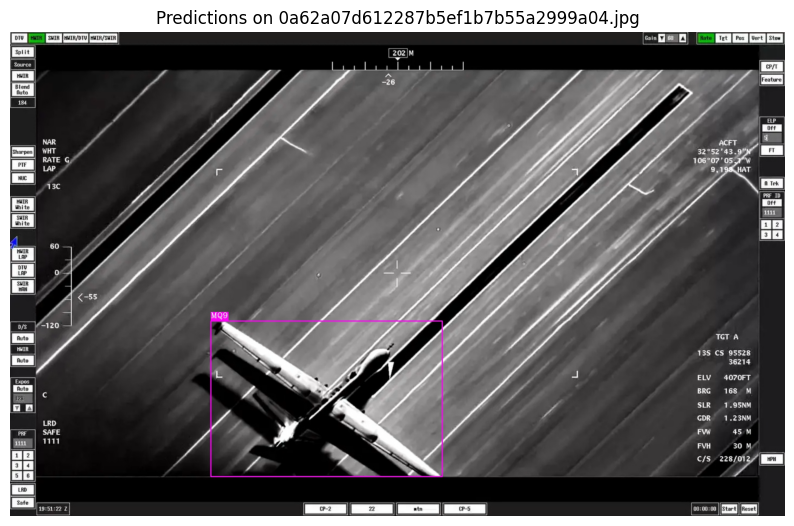

Processing image 6: /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/0bfff64a3a565cca4872296c9e20048f.jpg

image 1/1 /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/0bfff64a3a565cca4872296c9e20048f.jpg: 640x640 (no detections), 7.0ms
Speed: 3.2ms preprocess, 7.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


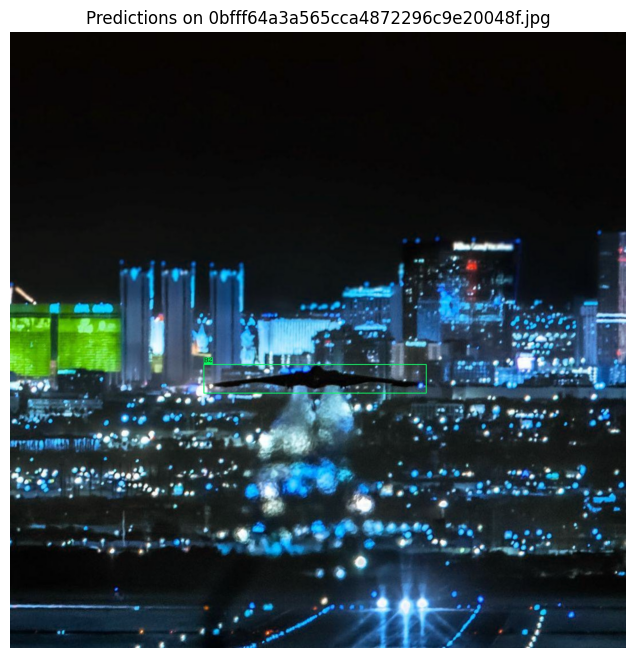

Processing image 7: /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/0c366b5e7bc10f8da08b040e11c41600.jpg

image 1/1 /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/0c366b5e7bc10f8da08b040e11c41600.jpg: 480x640 (no detections), 7.1ms
Speed: 2.5ms preprocess, 7.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


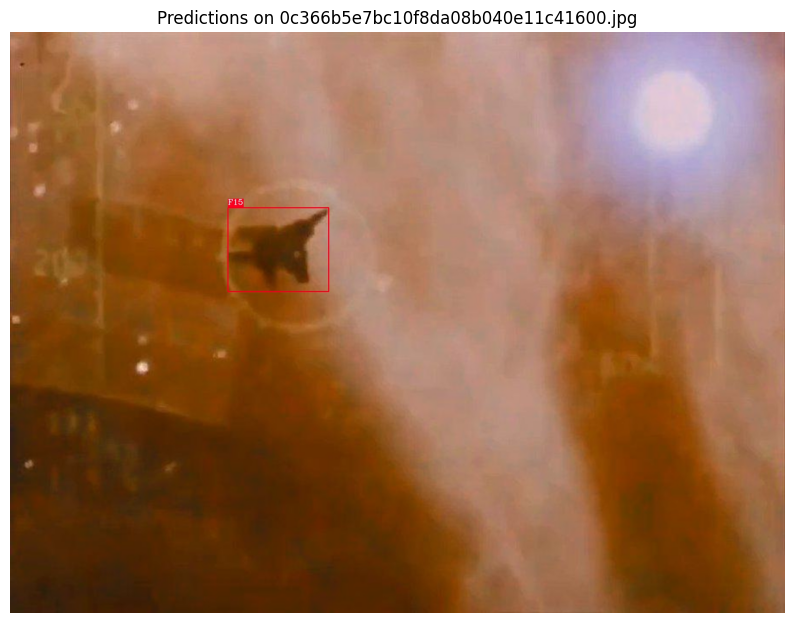

Processing image 8: /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/0d2fbceda7391630f168c7cc25f052cc.jpg

image 1/1 /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/0d2fbceda7391630f168c7cc25f052cc.jpg: 288x640 (no detections), 7.6ms
Speed: 1.7ms preprocess, 7.6ms inference, 0.5ms postprocess per image at shape (1, 3, 288, 640)


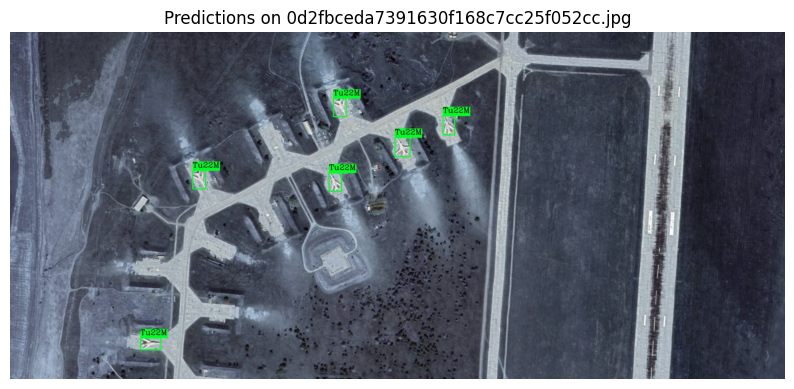

Processing image 9: /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/0d998b8650dd8d6e0c7d08b5fefa7a94.jpg

image 1/1 /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/0d998b8650dd8d6e0c7d08b5fefa7a94.jpg: 448x640 (no detections), 7.5ms
Speed: 2.4ms preprocess, 7.5ms inference, 0.6ms postprocess per image at shape (1, 3, 448, 640)


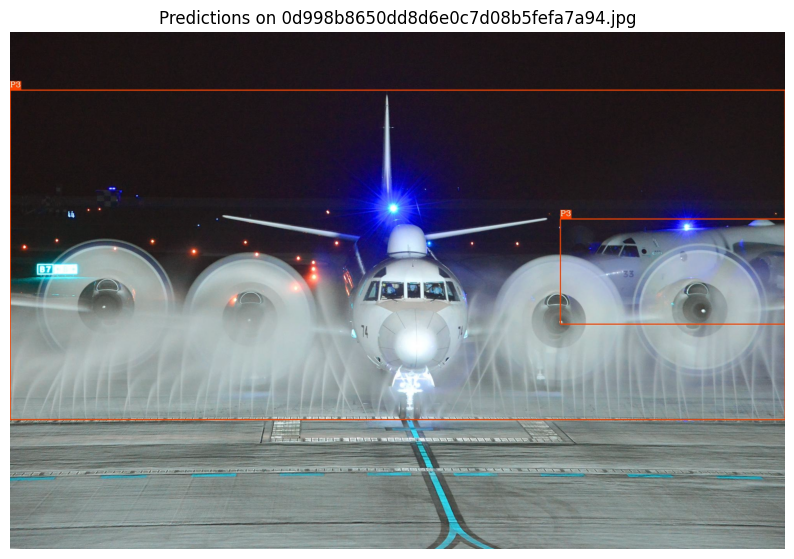

Processing image 10: /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/0dcbb580e1f3c7c458cbf90a4b97accf.jpg

image 1/1 /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/0dcbb580e1f3c7c458cbf90a4b97accf.jpg: 480x640 (no detections), 7.1ms
Speed: 2.5ms preprocess, 7.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


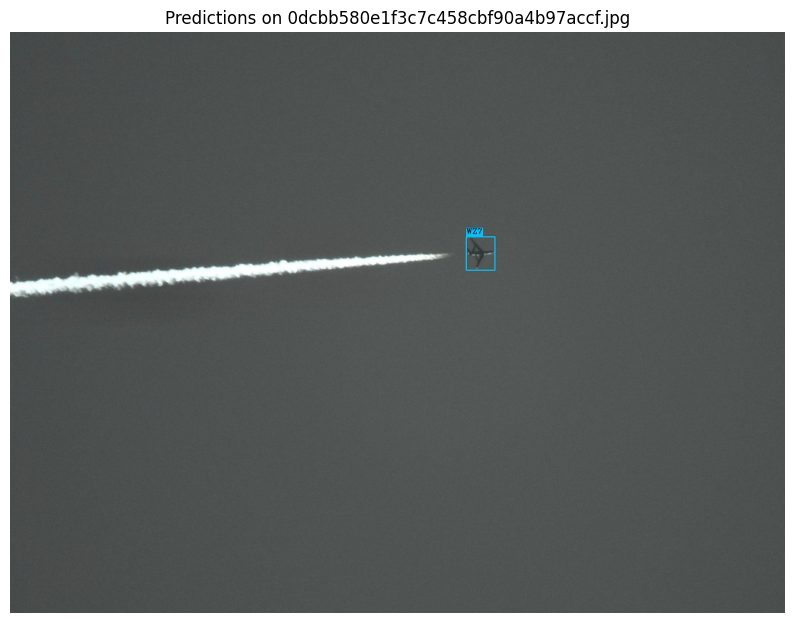

Processing image 11: /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/0ec1c0f3259d1eb340045a19b8c36405.jpg

image 1/1 /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/0ec1c0f3259d1eb340045a19b8c36405.jpg: 608x640 (no detections), 7.2ms
Speed: 3.1ms preprocess, 7.2ms inference, 0.5ms postprocess per image at shape (1, 3, 608, 640)


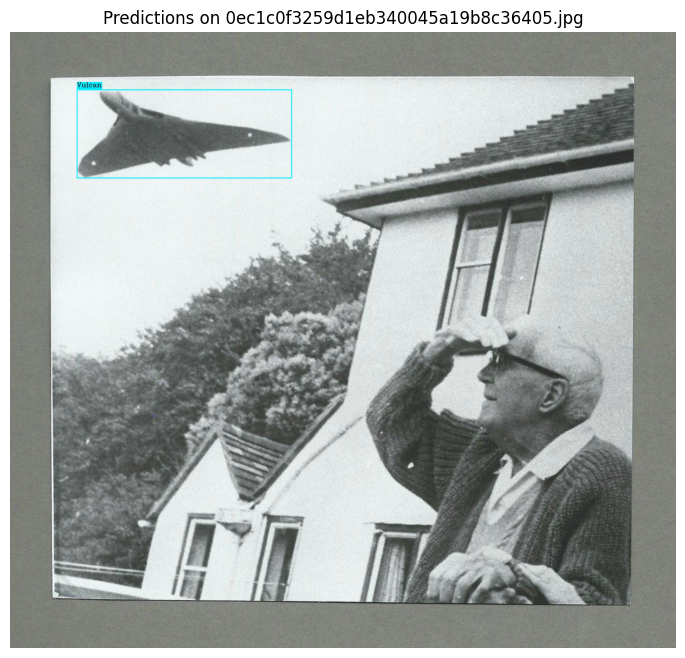

Processing image 12: /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/16858d7987fc669227b47900b0f93438.jpg

image 1/1 /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/16858d7987fc669227b47900b0f93438.jpg: 352x640 (no detections), 37.6ms
Speed: 2.0ms preprocess, 37.6ms inference, 0.6ms postprocess per image at shape (1, 3, 352, 640)


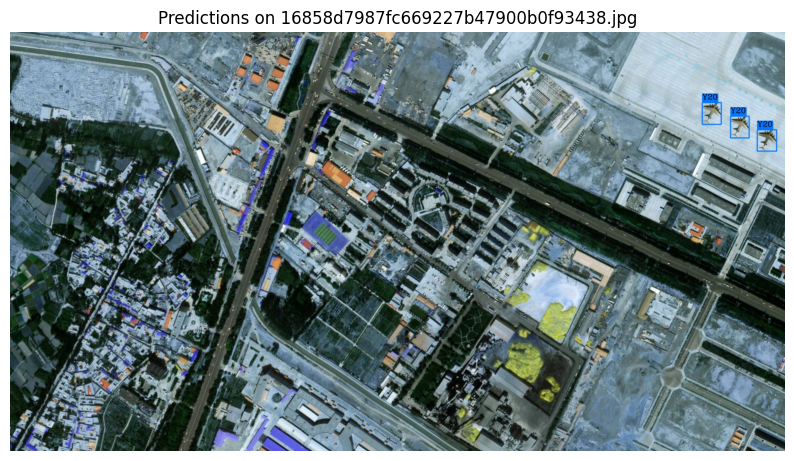

Processing image 13: /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/1a50aa53f075dee98ff8c1a34f4fb783.jpg

image 1/1 /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/1a50aa53f075dee98ff8c1a34f4fb783.jpg: 416x640 (no detections), 7.1ms
Speed: 2.2ms preprocess, 7.1ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


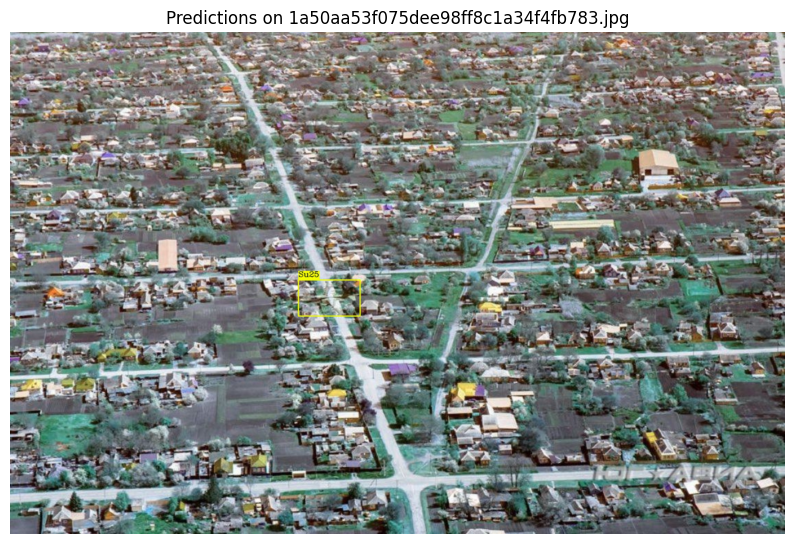

Processing image 14: /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/1a741ca31dabdb52e3ab0c3b43b8f2ed.jpg

image 1/1 /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/1a741ca31dabdb52e3ab0c3b43b8f2ed.jpg: 640x640 2 AG600s, 7.0ms
Speed: 3.3ms preprocess, 7.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


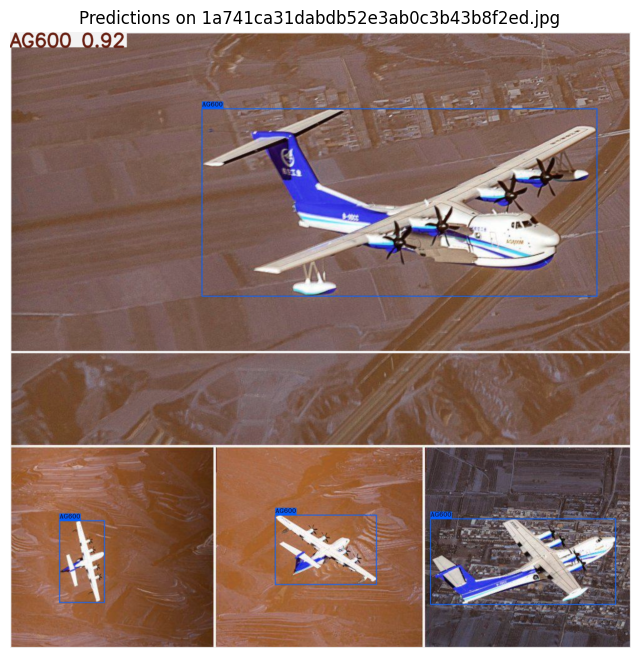

Processing image 15: /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/1b1860fdc92353079d1555d68a392b1f.jpg

image 1/1 /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/1b1860fdc92353079d1555d68a392b1f.jpg: 512x640 (no detections), 38.3ms
Speed: 2.6ms preprocess, 38.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 640)


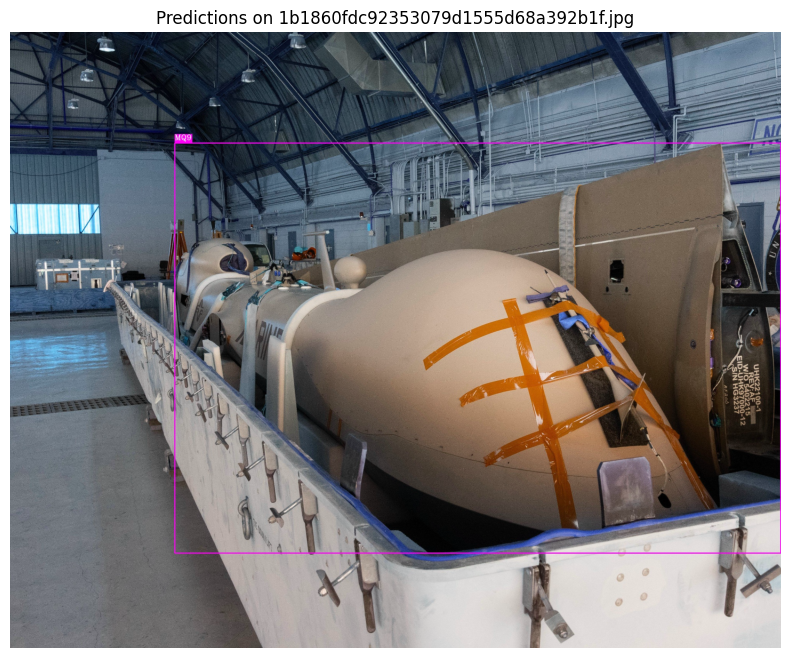

Processing image 16: /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/2573193c75826e2067d2f756bd188e92.jpg

image 1/1 /kaggle/input/militaryaircraftdetectiondataset/annotated_samples/2573193c75826e2067d2f756bd188e92.jpg: 480x640 (no detections), 7.1ms
Speed: 2.4ms preprocess, 7.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)


In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO

# Path to your test images folder
TEST_FOLDER = "/kaggle/input/militaryaircraftdetectiondataset/annotated_samples"  # Change to your folder path

# Path to your best model weights folder (update if necessary)
# For example, if your training saved weights in "runs/detect/train2/weights/best.pt":
WEIGHTS_PATH = os.path.join("runs", "detect", "train2", "weights", "best.pt")

# Check that the weights file exists
if not os.path.exists(WEIGHTS_PATH):
    print(f"Best model weights not found at {WEIGHTS_PATH}. Ensure that training has completed successfully.")
else:
    # Load the YOLO model with your trained weights
    model = YOLO(WEIGHTS_PATH)
    
    # List all image files in the test folder
    valid_extensions = (".jpg", ".jpeg", ".png", ".bmp")
    image_files = [os.path.join(TEST_FOLDER, f) for f in sorted(os.listdir(TEST_FOLDER)) if f.lower().endswith(valid_extensions)]
    
    # Limit to the first 10 images
    image_files = image_files[:20]
    
    # Iterate over each image, run inference, and display the output
    for idx, image_path in enumerate(image_files, start=1):
        print(f"Processing image {idx}: {image_path}")
        
        # Run inference on the image (set show=False because we'll display manually)
        results = model.predict(source=image_path, show=False)
        
        # Get the plotted output from the results. The `plot()` method returns the image with detections drawn.
        # results is a list; here, we work with the first result.
        out_img = results[0].plot()  # out_img is in RGB format.
        
        # Display the image using matplotlib
        plt.figure(figsize=(10, 8))
        plt.imshow(out_img)
        plt.title(f"Predictions on {os.path.basename(image_path)}")
        plt.axis("off")
        plt.show()


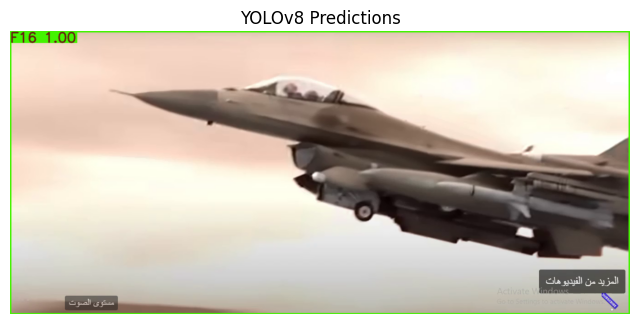

In [ ]:
import os
import cv2
import time
import matplotlib.pyplot as plt
from ultralytics import YOLO
from IPython.display import clear_output

# ------------------------------
# Configuration
# ------------------------------
VIDEO_PATH = "/kaggle/input/fffsddwe/Screen Recording 2025-04-14 000712.mp4"  # Update with your video file path.
WEIGHTS_PATH = os.path.join("runs", "detect", "train2", "weights", "best.pt")  # Update if needed.

# ------------------------------
# Load the model
# ------------------------------
if not os.path.exists(WEIGHTS_PATH):
    print(f"Best model weights not found at {WEIGHTS_PATH}. Ensure that training has completed successfully.")
else:
    model = YOLO(WEIGHTS_PATH)
    print(f"Loaded YOLO model from: {WEIGHTS_PATH}")

    # ------------------------------
    # Open the video file
    # ------------------------------
    cap = cv2.VideoCapture(VIDEO_PATH)
    if not cap.isOpened():
        print(f"Error: Unable to open video file: {VIDEO_PATH}")
    else:
        print(f"Starting video inference on: {VIDEO_PATH}")

        # ------------------------------
        # Process and display each frame
        # ------------------------------
        while True:
            ret, frame = cap.read()
            if not ret:
                print("No more frames or error reading frame; exiting loop.")
                break

            # Run inference on the current frame.
            # YOLO can accept a numpy array as an image.
            results = model(frame, verbose=False)
            # The results object's .plot() method returns the frame with detections drawn.
            annotated_frame = results[0].plot()

            # Display the frame inline.
            clear_output(wait=True)  # Clear the previous frame.
            plt.figure(figsize=(8, 6))
            plt.imshow(annotated_frame)
            plt.axis("off")
            plt.title("YOLOv8 Predictions")
            plt.show()

            # Add a short delay (adjust as needed for desired speed)
            time.sleep(0.1)

        cap.release()
        print("Video processing completed.")


In [22]:
import os
from IPython.display import HTML, display
from base64 import b64encode

OUTPUT_VIDEO = "/kaggle/working/output_predictions.mp4"

if not os.path.exists(OUTPUT_VIDEO):
    print(f"Output video not found at {OUTPUT_VIDEO}.")
else:
    # Read and encode the video file
    with open(OUTPUT_VIDEO, "rb") as f:
        video_data = f.read()
    encoded_video = b64encode(video_data).decode("ascii")
    
    # Create an HTML video tag with controls. Adjust width/height as needed.
    html = f"""
    <video width="640" height="480" controls>
        <source src="data:video/mp4;base64,{encoded_video}" type="video/mp4">
        Your browser does not support the video tag.
    </video>
    """
    display(HTML(html))


In [24]:
from IPython.display import FileLink, display

display(FileLink(OUTPUT_VIDEO, result_html_prefix="Download output video: "))


/kaggle/working/output_predictions.mp4